# Imports

In [73]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import io

# Image Display

Displaying some sample images from the data.

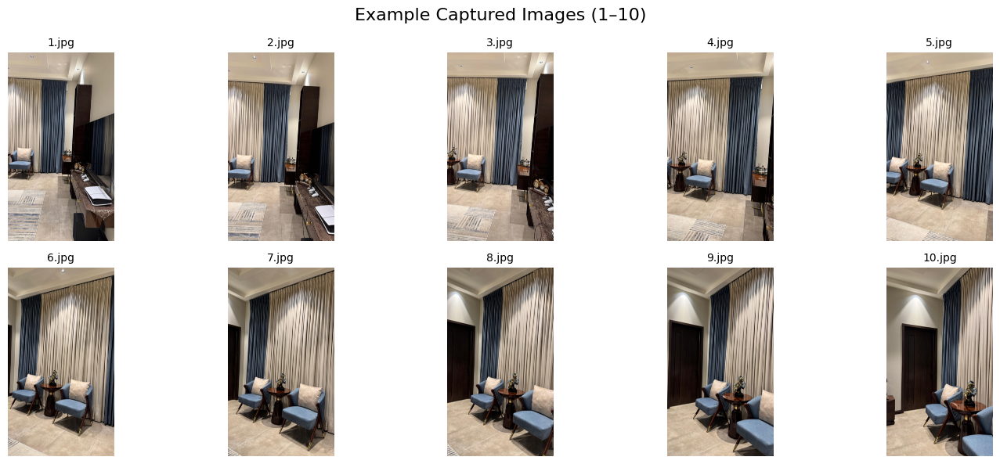

In [113]:
data_folder = 'data'

image_files = sorted([os.path.join(data_folder, f) for f in os.listdir(data_folder) if f.lower().endswith(('.jpg', '.png'))],
    key=lambda x: int(os.path.splitext(os.path.basename(x))[0])
)

example_images = image_files[:10]

#display in grid
def display_image_grid(images, rows=2, cols=5, figsize=(15, 6)):
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten()
    for i, img_path in enumerate(images):
        img = io.imread(img_path)
        axes[i].imshow(img)
        axes[i].axis('off')
        title = os.path.basename(img_path)
        axes[i].set_title(title, fontsize=10)
    plt.suptitle("Example Captured Images (1–10)", fontsize=16)
    plt.tight_layout()
    plt.show()

display_image_grid(example_images)

# Preprocessing

Resizing and Grayscaling the images from the dataset.

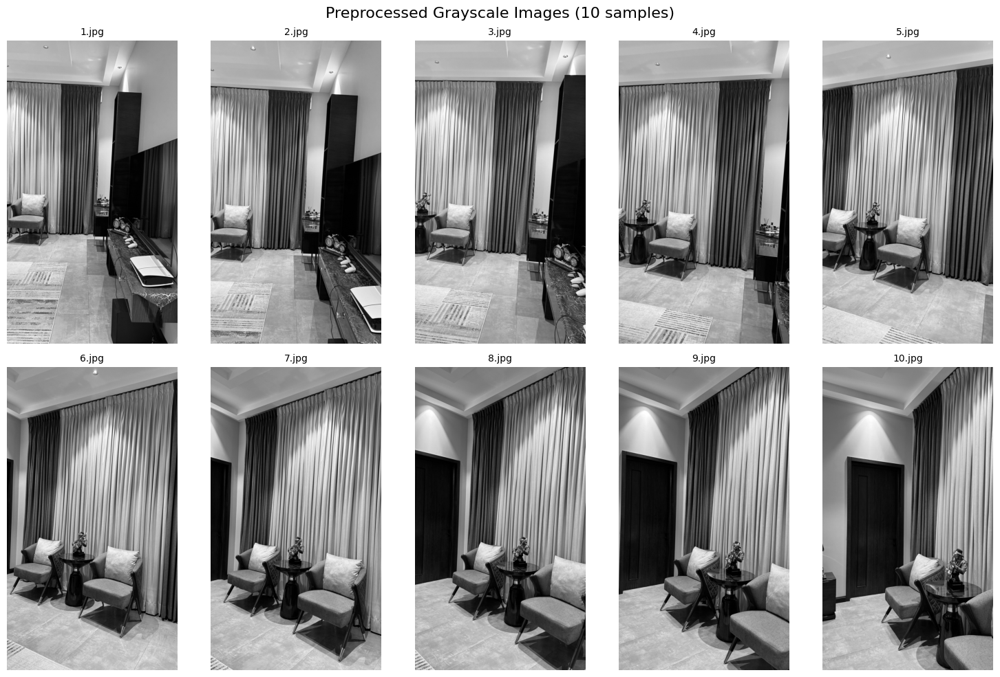

In [114]:
def preprocess_image_gray(image, max_dim=1440):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape[:2]
    scale = max_dim / max(h, w)
    new_size = (int(w * scale), int(h * scale))
    resized = cv2.resize(gray, new_size, interpolation=cv2.INTER_AREA)
    return resized

preprocessed_images_gray = [
    preprocess_image_gray(cv2.imread(img)) for img in example_images[:10]
]

plt.figure(figsize=(15, 10))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(preprocessed_images_gray[i], cmap='gray')
    plt.title(os.path.basename(example_images[i]), fontsize=10)
    plt.axis('off')

plt.suptitle("Preprocessed Grayscale Images (10 samples)", fontsize=16)
plt.tight_layout()
plt.show()

# Feature Mapping

Using SIFT for feature detection for 5 consecutive images

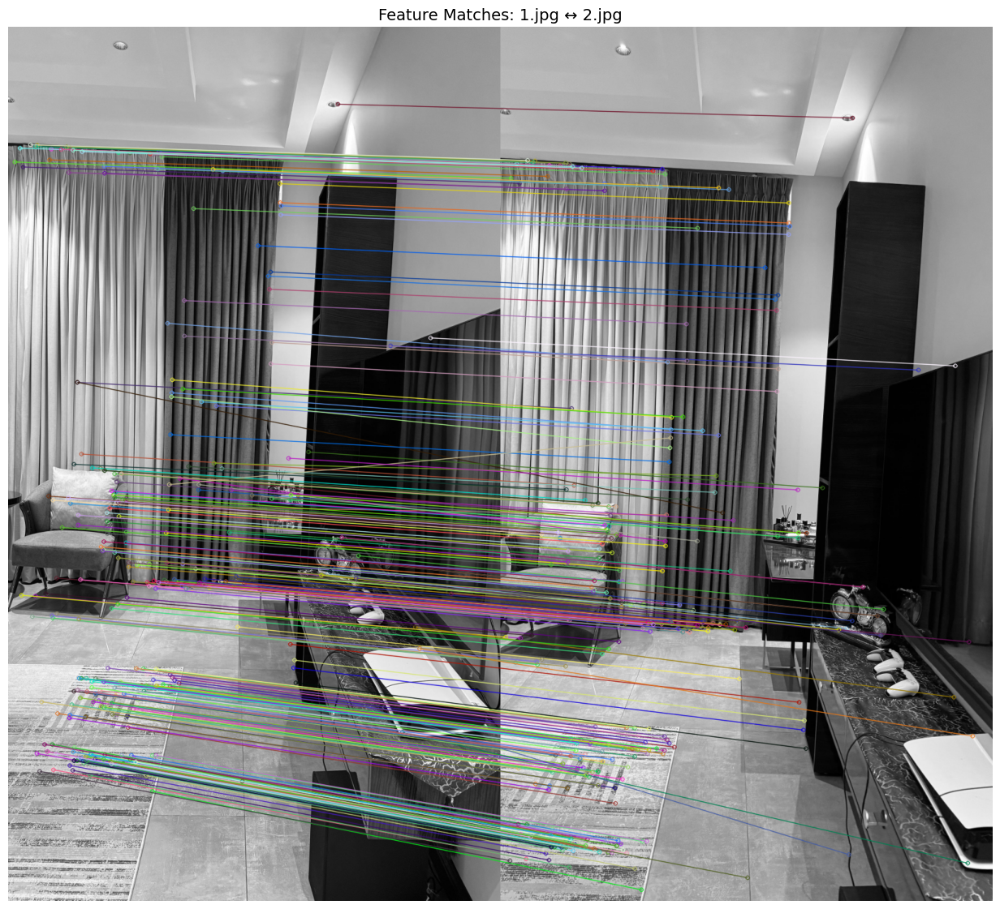

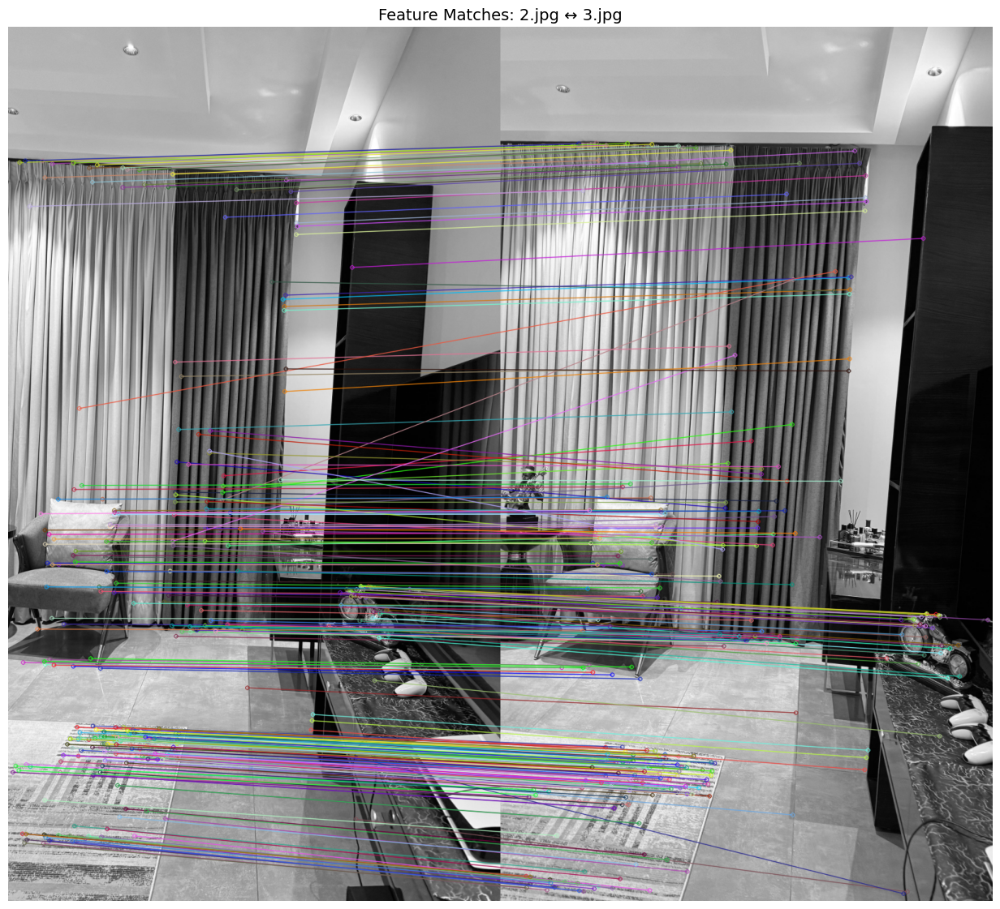

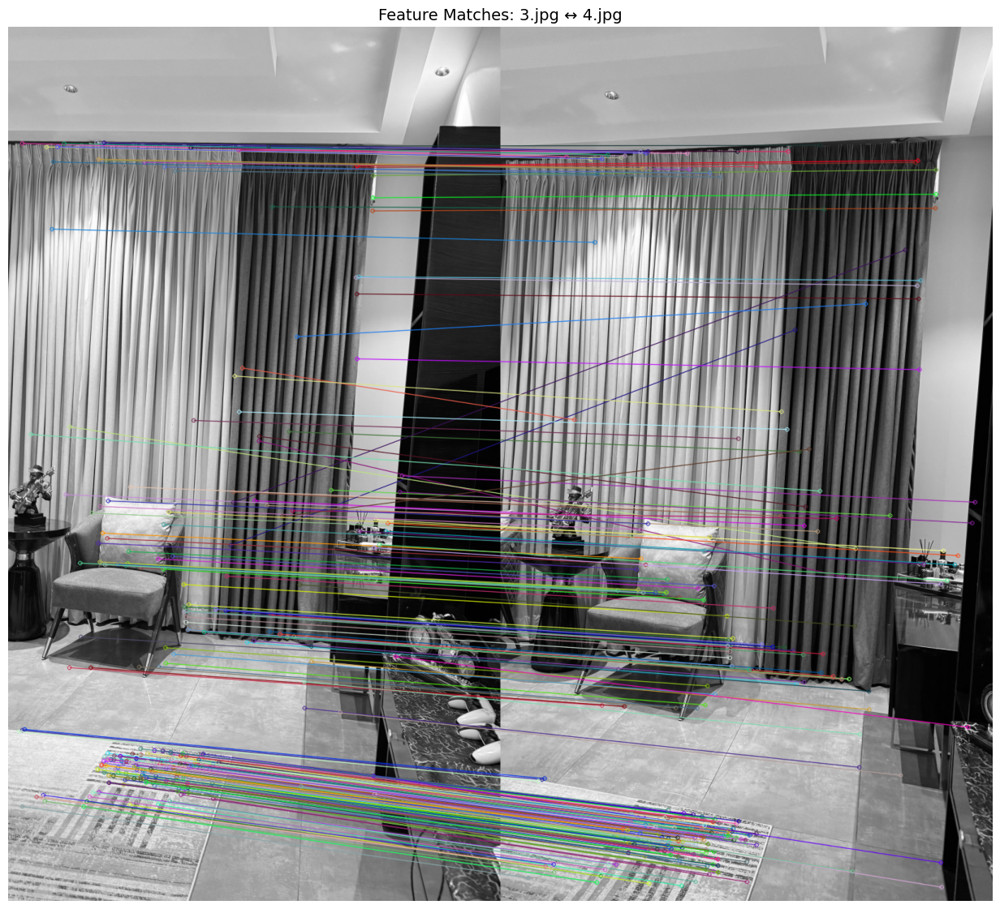

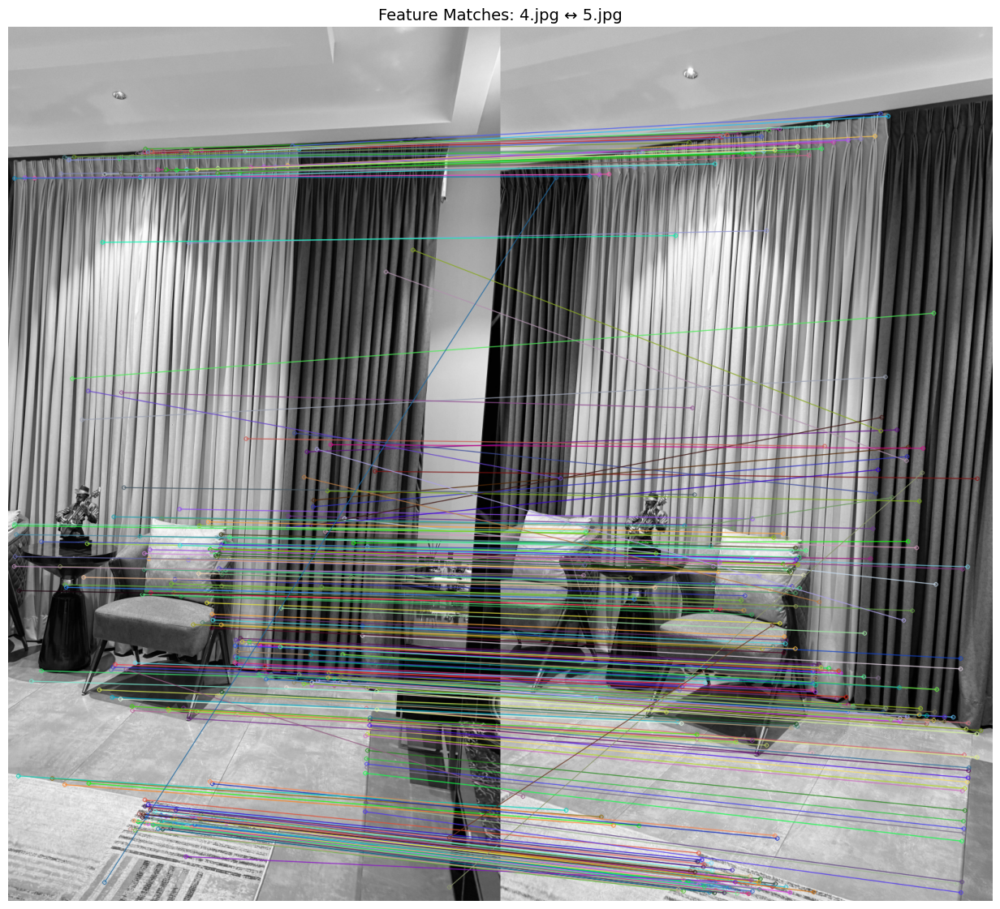

In [115]:
sift = cv2.SIFT_create()

#for keypoints and descriptors
def detect_features(image):
    keypoints, descriptors = sift.detectAndCompute(image, None)
    return keypoints, descriptors

def match_features(desc1, desc2):
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(desc1, desc2)
    matches = sorted(matches, key=lambda x: x.distance)
    return matches

#5 images chosen for feature mapping
consecutive_images = [cv2.imread(img) for img in example_images[:5]]
preprocessed_images = [preprocess_image_gray(img) for img in consecutive_images]

keypoints_list = []
descriptors_list = []
for img in preprocessed_images:
    kp, des = detect_features(img)
    keypoints_list.append(kp)
    descriptors_list.append(des)

matches_list = []
for i in range(len(descriptors_list) - 1):
    matches = match_features(descriptors_list[i], descriptors_list[i + 1])
    matches_list.append(matches)

def visualize_matches(img1, img2, kp1, kp2, matches, num_matches=100, title=None):
    img_matches = cv2.drawMatches(
        img1, kp1, img2, kp2, matches[:num_matches], None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    plt.figure(figsize=(18, 14))
    plt.imshow(img_matches, cmap='gray')
    if title:
        plt.title(title, fontsize=14)
    else:
        plt.title("Feature Matches", fontsize=14)
    plt.axis('off')
    plt.show()


for i in range(len(preprocessed_images) - 1):
    img1_name = os.path.basename(example_images[i])
    img2_name = os.path.basename(example_images[i + 1])
    title = f"Feature Matches: {img1_name} ↔ {img2_name}"
    visualize_matches(
        preprocessed_images[i],
        preprocessed_images[i + 1],
        keypoints_list[i],
        keypoints_list[i + 1],
        matches_list[i],
        num_matches=300, #adjust this to see more or less matches (set to None to see all matches), not all matches are geometrically correct(filtering is required(probably ransac) but that is not required here in the first deliverable)
        title=title,
    )